In [184]:
# LIME

In [185]:
!pip install lime

In [186]:
import lime
import lime.lime_tabular

In [187]:
explainer = lime.lime_tabular.LimeTabularExplainer(np.array(xtrain),
                                                   mode='regression',
                                                  feature_names=xtrain.columns,
                                                  class_names=['price'],
                                                  verbose=True)

In [188]:
explainer.feature_selection

'auto'

In [189]:
explainer.feature_frequencies

{0: array([0.28710678, 0.25852902, 0.27558706, 0.17877714]),
 1: array([0.25365529, 0.24811697, 0.25564909, 0.24257864]),
 2: array([0.94350908, 0.05649092, 0.        , 0.        ]),
 3: array([0.91404519, 0.08595481, 0.        , 0.        ]),
 4: array([0.89366416, 0.10633584, 0.        , 0.        ]),
 5: array([0.87284005, 0.12715995, 0.        , 0.        ]),
 6: array([0.93309703, 0.06690297, 0.        , 0.        ]),
 7: array([0.90828533, 0.09171467, 0.        , 0.        ]),
 8: array([0.87062472, 0.12937528, 0.        , 0.        ]),
 9: array([9.99556934e-01, 4.43066017e-04, 0.00000000e+00, 0.00000000e+00]),
 10: array([0.54785113, 0.45214887, 0.        , 0.        ]),
 11: array([0.28666371, 0.71333629, 0.        , 0.        ]),
 12: array([0.8396101, 0.1603899, 0.       , 0.       ]),
 13: array([0.98227736, 0.01772264, 0.        , 0.        ])}

In [190]:
# asking for explanation for LIME model
i = 60
exp = explainer.explain_instance(np.array(xtest)[i],
                                 new_model.predict, 
                                 num_features=14
                                )


Intercept 18.186435664326485
Prediction_local [28.15539047]
Right: 27.58547373488966


In [191]:
new_model.predict(xtest)[60]

27.58547373488966

In [192]:
ytest[60:61]

5304    35.0
Name: Price, dtype: float64

In [193]:
exp.show_in_notebook(show_table=True)

In [194]:
exp.as_list()

[('powerBhp > 138.10', 15.149884162603975),
 ('FuelType_Electric <= 0.00', -9.592427974318992),
 ('Age <= 4.00', 4.496580855673823),
 ('Transmission_Manual <= 0.00', 2.492797416064206),
 ('Location_Coimbatore <= 0.00', -2.4731730546033415),
 ('OwnerType_Third <= 0.00', -2.0832957270332315),
 ('Location_Bangalore > 0.00', 2.0697052807142198),
 ('Location_Hyderabad <= 0.00', -1.7296756759173524),
 ('FuelType_Petrol <= 0.00', 1.261075365963398),
 ('Location_Kolkata <= 0.00', 0.9825466864079457),
 ('Location_Chennai <= 0.00', -0.9425296926059566),
 ('OwnerType_Second <= 0.00', 0.47499056318203486),
 ('Location_Jaipur <= 0.00', -0.4165207998762409),
 ('Location_Mumbai <= 0.00', 0.27899739500956194)]

In [195]:
# Code for SP-LIME
import warnings
from lime import submodular_pick

# Remember to convert the dataframe to matrix values
# SP-LIME returns exaplanations on a sample set to provide a non redundant global decision boundary of original model
sp_obj = submodular_pick.SubmodularPick(explainer, np.array(xtrain), 
                                        new_model.predict, 
                                        num_features=14,
                                        num_exps_desired=10)

Intercept 20.405804040289283
Prediction_local [21.66418609]
Right: 18.547364644728198
Intercept 20.95803005616038
Prediction_local [6.62127326]
Right: 2.9068754422088445
Intercept 30.54209410399018
Prediction_local [7.47088779]
Right: 6.605339064995615
Intercept 22.276041789576496
Prediction_local [2.56617701]
Right: 3.315197967442519
Intercept 24.830320128636863
Prediction_local [6.03161557]
Right: 6.1481555358628075


Ill-conditioned matrix (rcond=9.68281e-29): result may not be accurate.


Intercept 21.7704502983341
Prediction_local [-1.0835787]
Right: 1.6990041650983176
Intercept 24.957406413578283
Prediction_local [2.4862498]
Right: 2.8451807954001422
Intercept 21.48440299521014
Prediction_local [2.95355592]
Right: 3.4370556045634677
Intercept 24.59889763630281
Prediction_local [1.06464552]
Right: 2.2483209709946443
Intercept 30.37931907973595
Prediction_local [9.9795265]
Right: 10.584175286488334
Intercept 22.664550134413496
Prediction_local [19.28746266]
Right: 12.2547715523415
Intercept 20.343581707198965
Prediction_local [4.99741029]
Right: 5.755514696118902
Intercept 25.669474178670853
Prediction_local [3.64198275]
Right: 5.278414321603634
Intercept 30.341744980835493
Prediction_local [3.61312233]
Right: 3.509834991284997
Intercept 16.871943039611807
Prediction_local [26.1793143]
Right: 32.48868683101921
Intercept 24.86928347244871
Prediction_local [17.34455105]
Right: 13.847076106844415
Intercept 14.654433369588713
Prediction_local [26.33626052]
Right: 32.4886868

Ill-conditioned matrix (rcond=1.16249e-29): result may not be accurate.


Intercept 10.228158860208591
Prediction_local [19.15360303]
Right: 9.797078978874552


Ill-conditioned matrix (rcond=2.37745e-28): result may not be accurate.


Intercept 16.5160724491046
Prediction_local [6.24480109]
Right: 7.510478861308049
Intercept 19.403886712891847
Prediction_local [6.96601524]
Right: 7.623055882931418
Intercept 12.819493362904153
Prediction_local [26.16276005]
Right: 41.4772803282592
Intercept 23.440605833894814
Prediction_local [0.97975015]
Right: 0.658424724377006
Intercept 25.467094701671062
Prediction_local [4.74264679]
Right: 4.234771027798581
Intercept 26.420088944028137
Prediction_local [0.86868939]
Right: 0.008071126475700297
Intercept 28.00628886586218
Prediction_local [4.31461784]
Right: 3.351196695912881
Intercept 22.771925559846295
Prediction_local [8.50868752]
Right: 7.721971119544287
Intercept 26.185096358864246
Prediction_local [1.0005548]
Right: 4.365906137841375
Intercept 29.983782507372418
Prediction_local [2.53167935]
Right: 3.38498259466402
Intercept 11.300099896098587
Prediction_local [23.43204741]
Right: 42.989473119396855
Intercept 26.02984489103729
Prediction_local [7.18950407]
Right: 9.625490999

Ill-conditioned matrix (rcond=6.3535e-28): result may not be accurate.


Intercept 13.064962382068284
Prediction_local [23.76297126]
Right: 21.620271919891316
Intercept 14.192455489148546
Prediction_local [25.8279515]
Right: 26.58485186848528
Intercept 24.89614577102249
Prediction_local [5.04774684]
Right: 6.116121045333335


Ill-conditioned matrix (rcond=1.1462e-30): result may not be accurate.


Intercept 7.590384112661614
Prediction_local [27.35176411]
Right: 26.67469110492855
Intercept 23.455710335528124
Prediction_local [0.74441168]
Right: 0.4267557110724116
Intercept 21.299103633454298
Prediction_local [-2.03947297]
Right: -3.4193092029804504
Intercept 19.466502636313137
Prediction_local [14.71649524]
Right: 14.23129703706384
Intercept 23.396868330635847
Prediction_local [1.85953951]
Right: 3.741856341239549


Ill-conditioned matrix (rcond=1.68224e-29): result may not be accurate.


Intercept 12.950303500373412
Prediction_local [15.80733845]
Right: 13.869759602521496
Intercept 30.158038984483603
Prediction_local [-4.16474718]
Right: -3.580166609225163
Intercept 16.527440661797037
Prediction_local [14.3191351]
Right: 12.602804525117184
Intercept 19.893611263103146
Prediction_local [9.01637499]
Right: 7.875609694052249


Ill-conditioned matrix (rcond=3.78994e-28): result may not be accurate.


Intercept 18.15723530481613
Prediction_local [9.03940268]
Right: 8.649747912524628
Intercept 17.781303378280672
Prediction_local [26.94274887]
Right: 52.49960188692508
Intercept 26.788852597388225
Prediction_local [1.84751424]
Right: -2.2211015321625034
Intercept 21.87446024788722
Prediction_local [3.48529337]
Right: 2.8002486599629925
Intercept 17.317862282816783
Prediction_local [15.68835854]
Right: 16.9277135699229
Intercept 15.60356041504454
Prediction_local [25.81223103]
Right: 25.598231684076424


Ill-conditioned matrix (rcond=1.0921e-27): result may not be accurate.


Intercept 13.816086682548313
Prediction_local [21.38912758]
Right: 13.165554182302616
Intercept 13.484302169453535
Prediction_local [23.28367069]
Right: 29.901707273019653
Intercept 19.78686594884852
Prediction_local [4.38195245]
Right: 4.54351490086589
Intercept 25.852894419974668
Prediction_local [-2.0146485]
Right: 0.5008097356685659
Intercept 23.459249251395413
Prediction_local [7.16358564]
Right: 5.17215584839281
Intercept 22.673117923750553
Prediction_local [8.21500742]
Right: 7.270590837279492
Intercept 21.801113425546692
Prediction_local [5.79974354]
Right: 5.730752725967301
Intercept 27.95170366879119
Prediction_local [1.02236587]
Right: 3.571440274717168
Intercept 25.570757873009647
Prediction_local [7.03252213]
Right: 5.889148849055631
Intercept 24.233496394926213
Prediction_local [5.70392232]
Right: 4.660312864421324
Intercept 19.904910081557
Prediction_local [11.9515008]
Right: 13.583441176067863
Intercept 24.412840171697617
Prediction_local [-1.55753273]
Right: -6.3645331

Ill-conditioned matrix (rcond=1.14476e-30): result may not be accurate.


Intercept 7.96913172565626
Prediction_local [28.64687503]
Right: 28.957489370863385
Intercept 18.182342389498398
Prediction_local [20.3416266]
Right: 15.65623061093653
Intercept 19.447260688391694
Prediction_local [21.59279938]
Right: 13.165554182302616
Intercept 29.053574630205187
Prediction_local [6.44368452]
Right: 8.498072803629148
Intercept 20.89736299560311
Prediction_local [18.5817436]
Right: 14.806402370149314
Intercept 21.462336847358536
Prediction_local [5.60604285]
Right: 6.205189979791952
Intercept 17.339182384184497
Prediction_local [20.39245219]
Right: 19.699791423356217
Intercept 18.993926962488437
Prediction_local [5.81780454]
Right: 5.9328521531019875
Intercept 21.478463101008437
Prediction_local [19.64991517]
Right: 13.646968459090372
Intercept 19.23646300914661
Prediction_local [6.50195003]
Right: 7.549157392894198
Intercept 18.893558760085963
Prediction_local [9.28368682]
Right: 7.907800276496145
Intercept 27.413585017483655
Prediction_local [0.5624995]
Right: 1.351

Ill-conditioned matrix (rcond=1.2029e-27): result may not be accurate.


Intercept 17.278941095401542
Prediction_local [9.94030864]
Right: 7.3252213559147465
Intercept 18.949338723741665
Prediction_local [8.13807421]
Right: 9.845238564963331
Intercept 21.555203140483158
Prediction_local [5.68164741]
Right: 7.076718974833948
Intercept 24.159763031236714
Prediction_local [5.51278754]
Right: 6.587226551857476
Intercept 20.20249483695619
Prediction_local [3.15619024]
Right: 4.761429166698731
Intercept 25.673126250383774
Prediction_local [1.88699163]
Right: 1.5223124862969835


Ill-conditioned matrix (rcond=2.32777e-28): result may not be accurate.


Intercept 21.20994624305319
Prediction_local [0.47779215]
Right: -0.3342396670257255
Intercept 25.61037865724721
Prediction_local [5.26852702]
Right: 6.587226551857476


Ill-conditioned matrix (rcond=9.39399e-28): result may not be accurate.


Intercept 10.059350300549037
Prediction_local [24.20164218]
Right: 20.679329408973267
Intercept 30.011423320372927
Prediction_local [1.70905593]
Right: -0.3516432893674235


Ill-conditioned matrix (rcond=1.80262e-29): result may not be accurate.


Intercept 14.519251208824791
Prediction_local [19.4200439]
Right: 55.850062017407005
Intercept 16.555886534450703
Prediction_local [20.13378828]
Right: 21.20999532516185
Intercept 25.543504980783204
Prediction_local [3.55428161]
Right: 4.648357400114296
Intercept 29.75097962830914
Prediction_local [5.40382969]
Right: 10.014392774111592
Intercept 10.87379349229632
Prediction_local [25.64367034]
Right: 24.485832507961042
Intercept 29.81541956243619
Prediction_local [-2.2849473]
Right: -5.431485269279969
Intercept 28.27815646599064
Prediction_local [1.25121014]
Right: 1.5307767367700071
Intercept 23.636223800262286
Prediction_local [11.17054829]
Right: 9.522106156615425
Intercept 21.028062509675916
Prediction_local [4.5674211]
Right: 5.936780096800227
Intercept 28.556709036944792
Prediction_local [2.69444519]
Right: 2.2846300331706537
Intercept 28.923183310605317
Prediction_local [-5.1459592]
Right: -6.573860829738994
Intercept 25.788172636767555
Prediction_local [4.797844]
Right: 5.81809

Ill-conditioned matrix (rcond=2.24484e-30): result may not be accurate.


Intercept 7.884343993408148
Prediction_local [28.61853162]
Right: 27.969993482343696
Intercept 18.18421803254219
Prediction_local [23.56693949]
Right: 23.476229186006982
Intercept 21.07231143417889
Prediction_local [3.97168833]
Right: 0.6135985683201644
Intercept 25.315654133346392
Prediction_local [3.92535926]
Right: 5.031944482026066
Intercept 25.58988138887995
Prediction_local [1.29977468]
Right: 0.007817759067652474


Ill-conditioned matrix (rcond=3.22164e-28): result may not be accurate.


Intercept 18.20775659243293
Prediction_local [12.13769964]
Right: 9.498009356822337
Intercept 21.370802512831762
Prediction_local [10.32658764]
Right: 8.58331989216321
Intercept 12.970840076201892
Prediction_local [27.63982522]
Right: 24.016407306517593
Intercept 16.84088416062888
Prediction_local [8.91594689]
Right: 5.960839625125321
Intercept 22.928924283234274
Prediction_local [23.2525365]
Right: 30.441387967551258
Intercept 14.347264050512454
Prediction_local [25.62526834]
Right: 24.869010191770208
Intercept 17.91938066115342
Prediction_local [7.98988882]
Right: 8.347257169584024
Intercept 18.877578662830587
Prediction_local [10.57588808]
Right: 10.998381590658973
Intercept 15.952846709818832
Prediction_local [27.87253612]
Right: 24.379835072556368
Intercept 24.05739735352778
Prediction_local [8.20959244]
Right: 8.912970204015547
Intercept 26.50053524358104
Prediction_local [-2.28788535]
Right: -2.520853115161737


Ill-conditioned matrix (rcond=5.47684e-30): result may not be accurate.


Intercept 13.991366215908009
Prediction_local [3.43721492]
Right: 3.3822338046191422
Intercept 25.369315418742797
Prediction_local [5.90604895]
Right: 5.909912694313016
Intercept 18.03251215803686
Prediction_local [24.69917621]
Right: 22.3732657414416
Intercept 26.345630491591024
Prediction_local [3.03392734]
Right: 2.4547299744528934
Intercept 22.33477461587352
Prediction_local [9.5474631]
Right: 8.752490144837548
Intercept 28.64522164137557
Prediction_local [-4.43036404]
Right: -3.357388683691557
Intercept 15.39675884830057
Prediction_local [23.64096581]
Right: 27.986755330373747
Intercept 20.576574255312877
Prediction_local [5.23158036]
Right: 5.676443921896361
Intercept 25.7971899681271
Prediction_local [1.36862972]
Right: 2.992315900499592
Intercept 18.053582762339133
Prediction_local [13.02697097]
Right: 10.270091194904772
Intercept 27.086392015972613
Prediction_local [-3.69310916]
Right: -5.524663127624221
Intercept 21.885829694021204
Prediction_local [9.36400324]
Right: 11.3175

Ill-conditioned matrix (rcond=2.88061e-28): result may not be accurate.


Intercept 20.792778963120227
Prediction_local [4.06096362]
Right: 3.6291207729981374
Intercept 22.05392124565707
Prediction_local [8.05277279]
Right: 7.721971119544287
Intercept 28.76124880424201
Prediction_local [7.67571737]
Right: 7.627647960420676
Intercept 26.12245413703159
Prediction_local [3.52927356]
Right: 1.6980998042565396
Intercept 19.32245737898252
Prediction_local [15.97225189]
Right: 28.924194135465044
Intercept 18.09363977346616
Prediction_local [24.70152221]
Right: 22.3732657414416
Intercept 12.378863922192686
Prediction_local [23.1308666]
Right: 16.424072913878884
Intercept 13.7171375077986
Prediction_local [11.80389723]
Right: 10.150747104142347
Intercept 32.63745050403171
Prediction_local [-0.30926015]
Right: 0.7540114059651355


Ill-conditioned matrix (rcond=9.69919e-29): result may not be accurate.


Intercept 14.026585488971111
Prediction_local [12.85313754]
Right: 15.514182217289077
Intercept 16.289818445276705
Prediction_local [25.67985044]
Right: 23.500623031964352
Intercept 16.546906968732344
Prediction_local [23.5298962]
Right: 22.531054549852428
Intercept 35.854541371010335
Prediction_local [-2.10446338]
Right: -1.4425660177194115
Intercept 27.212336728346955
Prediction_local [2.57475734]
Right: 0.3109686636410087
Intercept 23.25720105426544
Prediction_local [2.94084331]
Right: 2.328537045996546
Intercept 19.98359271332249
Prediction_local [16.60338624]
Right: 14.282735259054311
Intercept 27.35557203843128
Prediction_local [6.94783299]
Right: 8.50196967012396
Intercept 26.52558659076611
Prediction_local [8.29389942]
Right: 7.413617194010852
Intercept 28.957222245780557
Prediction_local [11.53488947]
Right: 12.07090066688861
Intercept 28.584276264149864
Prediction_local [11.19505213]
Right: 9.350675688881761
Intercept 18.084730716967343
Prediction_local [6.73984235]
Right: 9.

Ill-conditioned matrix (rcond=1.01551e-27): result may not be accurate.


Intercept 16.0079555535373
Prediction_local [10.97968956]
Right: 10.998381590658973
Intercept 22.7970295062256
Prediction_local [6.9466446]
Right: 6.086235016573912


Ill-conditioned matrix (rcond=4.52016e-30): result may not be accurate.


Intercept 14.444161165614016
Prediction_local [19.69206788]
Right: 16.447224657249777
Intercept 23.68528912496498
Prediction_local [6.55264108]
Right: 5.899984858910123
Intercept 26.676708050104622
Prediction_local [2.03642472]
Right: 0.7346021880042333
Intercept 25.246076568837005
Prediction_local [6.60879042]
Right: 5.789126775167652
Intercept 18.382358004754536
Prediction_local [11.01570322]
Right: 9.498009356822337
Intercept 20.47939579273652
Prediction_local [8.98619856]
Right: 9.004300506349278
Intercept 12.267137669382887
Prediction_local [25.35924104]
Right: 22.642545763134386


Ill-conditioned matrix (rcond=1.31773e-27): result may not be accurate.


Intercept 19.21568687066039
Prediction_local [2.83143172]
Right: 4.765661291935244
Intercept 22.462747560453238
Prediction_local [9.34110663]
Right: 11.724671250345441


Ill-conditioned matrix (rcond=3.09961e-29): result may not be accurate.


Intercept 18.633144859621858
Prediction_local [0.01562959]
Right: 1.670676422787226
Intercept 18.891185587954503
Prediction_local [23.68200614]
Right: 21.42709049045243
Intercept 20.383896555741828
Prediction_local [8.62151573]
Right: 6.65483612970736


Ill-conditioned matrix (rcond=1.01383e-27): result may not be accurate.


Intercept 19.19441761074568
Prediction_local [3.20746103]
Right: 4.765661291935244
Intercept 20.98758990661822
Prediction_local [15.18004104]
Right: 8.555748406003348
Intercept 19.086086119236022
Prediction_local [5.6454122]
Right: 5.294407349830836
Intercept 27.713853125174353
Prediction_local [7.57631115]
Right: 8.026790244391218
Intercept 23.969050014265797
Prediction_local [5.05992665]
Right: 5.805872509708914
Intercept 28.34674369323666
Prediction_local [2.65605446]
Right: 2.2846300331706537
Intercept 21.96749201129894
Prediction_local [2.6754312]
Right: 6.614949065115319


Ill-conditioned matrix (rcond=1.79311e-28): result may not be accurate.


Intercept 16.620520409256052
Prediction_local [9.03271262]
Right: 11.19741447604587


Ill-conditioned matrix (rcond=9.82592e-29): result may not be accurate.


Intercept 21.333148460414215
Prediction_local [3.55532741]
Right: 4.478991670446463
Intercept 26.93987108089968
Prediction_local [8.00433376]
Right: 9.54353637946652
Intercept 24.569963455267306
Prediction_local [6.9044758]
Right: 4.691457407122466
Intercept 21.918875791381605
Prediction_local [3.43453764]
Right: 5.2777250495064525
Intercept 20.067770087449553
Prediction_local [8.98677413]
Right: 9.020428966183896
Intercept 29.79800274015392
Prediction_local [5.90460453]
Right: 7.15125654931782
Intercept 24.08017529208405
Prediction_local [4.54324002]
Right: 3.2885905214760225


Ill-conditioned matrix (rcond=3.15638e-29): result may not be accurate.


Intercept 7.83949961325374
Prediction_local [28.26292432]
Right: 38.02075591476061
Intercept 35.62735551717184
Prediction_local [3.50994432]
Right: 3.699526916932931
Intercept 14.0600885696138
Prediction_local [16.27906799]
Right: 14.416652596258551
Intercept 26.51651547740085
Prediction_local [6.75062878]
Right: 7.256112872978846
Intercept 26.33623373539627
Prediction_local [9.05203349]
Right: 7.705071275329181
Intercept 17.916979512882097
Prediction_local [11.91405207]
Right: 12.773876193336582
Intercept 18.880089229732334
Prediction_local [10.56560704]
Right: 11.60577590116029
Intercept 13.454147778633443
Prediction_local [26.45299102]
Right: 23.937848140549534
Intercept 23.199793997261835
Prediction_local [5.67356717]
Right: 5.265644810214286
Intercept 28.179466714808257
Prediction_local [0.09225232]
Right: 1.9343981654390259
Intercept 24.12994476844151
Prediction_local [-0.51624139]
Right: -0.2907885231522247
Intercept 24.107128533579868
Prediction_local [3.6290751]
Right: 2.86791

Ill-conditioned matrix (rcond=2.34904e-28): result may not be accurate.


Intercept 14.067804632650283
Prediction_local [14.23764536]
Right: 13.368913692113853


Ill-conditioned matrix (rcond=3.85268e-28): result may not be accurate.


Intercept 18.13281762056813
Prediction_local [7.24997277]
Right: 5.874758031422022
Intercept 14.31580365366765
Prediction_local [25.10516155]
Right: 21.751848485202906
Intercept 16.314538490889326
Prediction_local [13.21379686]
Right: 12.603855799760003
Intercept 17.60823290609974
Prediction_local [23.98270385]
Right: 19.363138460417737


Ill-conditioned matrix (rcond=1.96304e-28): result may not be accurate.


Intercept 20.44937980035281
Prediction_local [0.58645427]
Right: -4.3075703937341565
Intercept 24.1630398231845
Prediction_local [-2.18831082]
Right: -0.9028853231878031
Intercept 30.825085347466498
Prediction_local [9.96400848]
Right: 8.518145668310058
Intercept 22.971150953519928
Prediction_local [3.23181978]
Right: 4.201377927066851
Intercept 22.42124068542266
Prediction_local [3.65369899]
Right: 2.582273984570065


Ill-conditioned matrix (rcond=2.69819e-28): result may not be accurate.


Intercept 20.700001231829667
Prediction_local [5.77280735]
Right: 5.19931243550402
Intercept 15.647701698462381
Prediction_local [24.51271938]
Right: 22.620631064227645
Intercept 24.516264027621943
Prediction_local [-1.53710564]
Right: -4.292991684528165
Intercept 20.937962884846183
Prediction_local [2.3697624]
Right: 4.969402446023878
Intercept 26.71210425139692
Prediction_local [5.83324438]
Right: 5.398702768444281


Ill-conditioned matrix (rcond=1.70016e-28): result may not be accurate.


Intercept 21.387453229711326
Prediction_local [-4.53857723]
Right: -6.295164997450533
Intercept 12.23084246965584
Prediction_local [24.6246499]
Right: 18.53550580223378


Ill-conditioned matrix (rcond=2.35432e-28): result may not be accurate.


Intercept 20.28211001765157
Prediction_local [3.3525657]
Right: 4.5174906149825595
Intercept 24.948068375444613
Prediction_local [-0.44255561]
Right: -3.2250620204678704
Intercept 18.808857048970587
Prediction_local [4.80101261]
Right: 5.761157529767586
Intercept 19.84691642277118
Prediction_local [6.84771993]
Right: 6.370340164620594
Intercept 18.860774603236482
Prediction_local [2.16851112]
Right: 3.8000481716049226
Intercept 21.202578742134612
Prediction_local [5.27461861]
Right: 3.4167448280712116


Ill-conditioned matrix (rcond=7.64386e-30): result may not be accurate.


Intercept 19.68547772638108
Prediction_local [4.52235062]
Right: 4.808518254293526
Intercept 25.644546432280904
Prediction_local [-2.23801747]
Right: -0.014009746846328941
Intercept 26.147911428842335
Prediction_local [-1.5984572]
Right: -0.04521061694596762
Intercept 17.438011501030214
Prediction_local [23.97725916]
Right: 31.354159963871098
Intercept 28.252017144456545
Prediction_local [-5.14464155]
Right: -8.496254473891975
Intercept 18.57673047038086
Prediction_local [11.69881375]
Right: 13.463354409440461
Intercept 24.633088584391544
Prediction_local [2.84933981]
Right: 2.623034404330789
Intercept 25.50057810241841
Prediction_local [10.42014145]
Right: 9.543981200880886
Intercept 22.70601811482112
Prediction_local [13.93907854]
Right: 16.29886056500516
Intercept 18.74893360415791
Prediction_local [12.30183733]
Right: 13.239586776206613
Intercept 27.256436313442258
Prediction_local [5.22128699]
Right: 6.680404410201728
Intercept 25.01484126673708
Prediction_local [7.963681]
Right: 

Ill-conditioned matrix (rcond=1.66875e-28): result may not be accurate.


Intercept 20.224950616821857
Prediction_local [7.28422762]
Right: 6.52451886809439


Ill-conditioned matrix (rcond=2.70984e-29): result may not be accurate.


Intercept 10.707543553619296
Prediction_local [27.17577885]
Right: 22.216921277337207
Intercept 22.606221176832932
Prediction_local [7.04537586]
Right: 8.50196967012396
Intercept 22.493932313163135
Prediction_local [9.15980802]
Right: 8.852933648959196
Intercept 21.755028810129218
Prediction_local [4.40203972]
Right: 3.3873555195989784
Intercept 16.516159076040335
Prediction_local [21.13403205]
Right: 23.567864460509
Intercept 32.34626337179985
Prediction_local [6.40388412]
Right: 6.345330243017729
Intercept 19.164541751658994
Prediction_local [19.99874911]
Right: 13.32729062857114
Intercept 28.722405423619332
Prediction_local [3.14499453]
Right: 1.770359208702013


Ill-conditioned matrix (rcond=1.26757e-27): result may not be accurate.


Intercept 18.914499870702286
Prediction_local [5.30925622]
Right: 6.164014028206182


Ill-conditioned matrix (rcond=1.04886e-28): result may not be accurate.


Intercept 18.608547673536485
Prediction_local [-1.56470104]
Right: 2.1123841762744355
Intercept 36.60243598444255
Prediction_local [6.21680389]
Right: 5.285827453188212
Intercept 26.447393112853156
Prediction_local [3.02597358]
Right: 4.765661291935244
Intercept 27.344700683895503
Prediction_local [1.31413225]
Right: 0.47029045074976716
Intercept 27.828700996039423
Prediction_local [3.54029285]
Right: 4.1155190184162675
Intercept 15.164784551179356
Prediction_local [21.48862349]
Right: 24.343624810529278


Ill-conditioned matrix (rcond=9.92571e-28): result may not be accurate.


Intercept 10.63250142962063
Prediction_local [26.36893185]
Right: 37.11335310197204
Intercept 23.394775797676516
Prediction_local [4.14346974]
Right: 5.201229491486584
Intercept 19.908488837899213
Prediction_local [8.62317459]
Right: 9.63866882726397
Intercept 18.31110623834948
Prediction_local [1.91136521]
Right: -0.5466330933255641
Intercept 16.839662070762344
Prediction_local [14.28523064]
Right: 13.779022292634128
Intercept 25.470798001651666
Prediction_local [5.29735463]
Right: 4.803199891193858
Intercept 12.32299787614619
Prediction_local [26.62213105]
Right: 20.27578650218993
Intercept 20.29901626849025
Prediction_local [9.03161849]
Right: 8.384583072552719
Intercept 20.612109275340813
Prediction_local [5.3209742]
Right: 4.9681930068098445
Intercept 20.650442502755098
Prediction_local [11.57556783]
Right: 10.432888786576543
Intercept 29.036441702483287
Prediction_local [3.67821319]
Right: 3.0964974265189014
Intercept 14.393429064733876
Prediction_local [23.49627035]
Right: 22.65

Ill-conditioned matrix (rcond=4.61219e-32): result may not be accurate.


Intercept 11.146534770059771
Prediction_local [24.0826429]
Right: 23.098284937743898
Intercept 21.284282762109118
Prediction_local [6.35316754]
Right: 6.6415353559284185
Intercept 16.292596797769036
Prediction_local [18.98626272]
Right: 17.0879740996672
Intercept 21.989593489556157
Prediction_local [11.58435814]
Right: 13.340779071576096
Intercept 26.78430883073215
Prediction_local [3.59653952]
Right: 2.3163470178573995
Intercept 21.646863113493406
Prediction_local [8.24407894]
Right: 7.721971119544287
Intercept 18.541424020864703
Prediction_local [23.61744222]
Right: 16.77829812497007
Intercept 18.747305115831097
Prediction_local [10.83930101]
Right: 10.998381590658973


Ill-conditioned matrix (rcond=1.23808e-27): result may not be accurate.


Intercept 16.338066303968414
Prediction_local [8.36523694]
Right: 9.575982672946454
Intercept 22.189004878351398
Prediction_local [5.88136417]
Right: 4.650879391037513
Intercept 19.70220067948882
Prediction_local [9.39990593]
Right: 10.10185396377571
Intercept 26.55982514086427
Prediction_local [3.7929664]
Right: 3.837609461218583
Intercept 21.67623798239579
Prediction_local [8.63205899]
Right: 7.0619938703103085
Intercept 32.936148551915394
Prediction_local [-5.77315772]
Right: -7.877890406886321
Intercept 26.54901684521161
Prediction_local [-2.66458474]
Right: -1.0539417909665314


Ill-conditioned matrix (rcond=5.05851e-28): result may not be accurate.


Intercept 11.147502868154888
Prediction_local [24.03657488]
Right: 20.979275296464344
Intercept 13.690768476822281
Prediction_local [17.61389039]
Right: 12.81469262591621
Intercept 17.110171856485408
Prediction_local [13.65439863]
Right: 17.850875271830922
Intercept 13.889020744904812
Prediction_local [25.85043563]
Right: 23.504855157200865
Intercept 30.699909304142615
Prediction_local [-4.56065856]
Right: -4.371238650769696
Intercept 22.250327776381436
Prediction_local [7.85079806]
Right: 7.80398651194205
Intercept 26.535931951925928
Prediction_local [1.12699146]
Right: 2.681818270938617
Intercept 20.489527437231622
Prediction_local [4.62890616]
Right: -0.041734550646751245
Intercept 28.639841661439846
Prediction_local [3.4801791]
Right: 4.449942535129329
Intercept 23.5853884627102
Prediction_local [-2.6625277]
Right: -2.583205922190551
Intercept 20.429336756756953
Prediction_local [15.87912424]
Right: 18.321679066128375
Intercept 24.834243485041718
Prediction_local [5.12747649]
Right

Ill-conditioned matrix (rcond=5.60233e-30): result may not be accurate.


Intercept 12.735679947265858
Prediction_local [17.20076587]
Right: 22.030342942089256
Intercept 25.271387996423243
Prediction_local [2.45930144]
Right: 1.0313010313078927
Intercept 21.542745425656264
Prediction_local [4.26046839]
Right: 4.987329650351552
Intercept 23.320766524846526
Prediction_local [6.76203073]
Right: 7.5965498273494525
Intercept 21.89046863071342
Prediction_local [-0.5822874]
Right: -0.9707499778186381
Intercept 15.738494292078592
Prediction_local [23.22237348]
Right: 15.991079930530216
Intercept 18.53823364199956
Prediction_local [16.32995861]
Right: 15.166877416491324
Intercept 24.218949372476025
Prediction_local [8.22833069]
Right: 8.7626100265661
Intercept 24.883866147296835
Prediction_local [-2.75345453]
Right: -5.864232052006969
Intercept 20.393899558297473
Prediction_local [23.7687879]
Right: 47.53590604157453


Ill-conditioned matrix (rcond=3.35891e-29): result may not be accurate.


Intercept 19.87588118611416
Prediction_local [2.2773036]
Right: 3.5470240131008186
Intercept 26.655405572655162
Prediction_local [4.10288681]
Right: 4.3963114704192146
Intercept 26.30697071050772
Prediction_local [8.00572415]
Right: 8.768252860214783
Intercept 25.27083552047371
Prediction_local [2.18893927]
Right: 0.8118180591359074
Intercept 18.544424906167325
Prediction_local [9.76147153]
Right: 8.688834219396366
Intercept 16.57839554121093
Prediction_local [12.23680311]
Right: 13.951124463390009
Intercept 18.262159688083663
Prediction_local [11.42861176]
Right: 11.44066072100868
Intercept 28.498015729783297
Prediction_local [4.68864982]
Right: 5.577528685283491
Intercept 22.653872184157898
Prediction_local [2.26877694]
Right: 1.865481070386871


Ill-conditioned matrix (rcond=1.04115e-29): result may not be accurate.


Intercept 16.769208382096757
Prediction_local [7.08125592]
Right: 7.296744944103992
Intercept 21.71672603055851
Prediction_local [11.87437251]
Right: 9.14678661583698
Intercept 20.72966661821995
Prediction_local [3.45724153]
Right: 3.4561597895842198


Ill-conditioned matrix (rcond=1.45417e-27): result may not be accurate.


Intercept 20.798437617120825
Prediction_local [2.55445286]
Right: 3.461695853222592
Intercept 17.535553647930517
Prediction_local [14.46094462]
Right: 14.78689042033738
Intercept 21.25368460635761
Prediction_local [16.23862833]
Right: 27.54339433346155
Intercept 15.514460340836834
Prediction_local [18.73315784]
Right: 23.30638838312622
Intercept 28.254753191588783
Prediction_local [-2.0175433]
Right: -1.0950579658505841
Intercept 20.746024026907033
Prediction_local [6.54137352]
Right: 5.245067097507258
Intercept 27.22463019131653
Prediction_local [8.71938562]
Right: 7.965722958210571
Intercept 23.057276352467575
Prediction_local [7.09844436]
Right: 7.926028818177937
Intercept 27.889739060603713
Prediction_local [9.84188403]
Right: 11.23728418661049


Ill-conditioned matrix (rcond=2.55775e-28): result may not be accurate.


Intercept 18.620299277279592
Prediction_local [7.12953484]
Right: 6.001592511843654
Intercept 15.361856358986607
Prediction_local [21.50281747]
Right: 23.244277229820504


Ill-conditioned matrix (rcond=2.90736e-30): result may not be accurate.


Intercept 15.238428100056591
Prediction_local [14.33624782]
Right: 13.309919535541034
Intercept 27.79203587849632
Prediction_local [3.55026009]
Right: 1.535369850826759
Intercept 25.548430873064135
Prediction_local [-4.07217226]
Right: -2.9002051545587495
Intercept 22.53350229804543
Prediction_local [-1.4487389]
Right: -4.441543248615178
Intercept 20.160518806332032
Prediction_local [-2.46196754]
Right: -3.8811591707140796
Intercept 22.515177001669315
Prediction_local [15.84477447]
Right: 8.003665690021538
Intercept 26.80901707797178
Prediction_local [3.68813841]
Right: 0.46022410398082414
Intercept 19.293398400960804
Prediction_local [12.13160928]
Right: 10.86588176992521
Intercept 20.85287502994946
Prediction_local [14.35506748]
Right: 11.061529734103464
Intercept 29.00955133974493
Prediction_local [6.25509218]
Right: 7.726353006244015
Intercept 26.399400499517903
Prediction_local [2.96388998]
Right: 3.8548786619741273
Intercept 13.315743618435647
Prediction_local [23.94384996]
Right

Ill-conditioned matrix (rcond=1.97151e-28): result may not be accurate.


Intercept 25.55334402532662
Prediction_local [-1.23163946]
Right: -6.340290547996112
Intercept 27.608925953240693
Prediction_local [-2.71587743]
Right: -0.33868150602507363
Intercept 22.39137799128465
Prediction_local [-1.55447036]
Right: -2.6988911787749537
Intercept 16.380154153357743
Prediction_local [25.44476527]
Right: 19.731199754845704
Intercept 24.06022541925976
Prediction_local [-1.02614014]
Right: -3.7090448828889446
Intercept 21.577343310993893
Prediction_local [3.71585185]
Right: 3.0788152155776993
Intercept 25.982049976368394
Prediction_local [-1.86569151]
Right: -0.8322206259054981
Intercept 30.84353998981301
Prediction_local [-0.53037182]
Right: 0.09872582139508346
Intercept 29.48667436920639
Prediction_local [-0.81730392]
Right: 1.0184182771105106


Ill-conditioned matrix (rcond=2.2381e-29): result may not be accurate.


Intercept 21.151494773040852
Prediction_local [-2.39805877]
Right: -1.5103254557859178
Intercept 26.17091200491742
Prediction_local [3.91033997]
Right: 4.199373151437138
Intercept 25.715061740244153
Prediction_local [6.92929981]
Right: 5.203799064541375


Ill-conditioned matrix (rcond=1.15705e-30): result may not be accurate.


Intercept 14.618641404315754
Prediction_local [19.53729356]
Right: 12.718600329766186


Ill-conditioned matrix (rcond=4.2967e-28): result may not be accurate.


Intercept 13.890275480735156
Prediction_local [20.92961833]
Right: 16.646263185784555
Intercept 16.03486161373837
Prediction_local [25.82475589]
Right: 22.642545763134386
Intercept 24.7458317139377
Prediction_local [1.91176503]
Right: 2.5041655411679864
Intercept 25.18570629353454
Prediction_local [4.51220724]
Right: 4.927397738203765
Intercept 19.534855842670652
Prediction_local [8.62443009]
Right: 7.9294341121733645
Intercept 14.815298083586871
Prediction_local [26.07214716]
Right: 25.39097230427347
Intercept 16.49443716433121
Prediction_local [25.16034962]
Right: 21.27505863822138
Intercept 13.50871912757646
Prediction_local [28.75583314]
Right: 24.41140566192547


Ill-conditioned matrix (rcond=2.01357e-28): result may not be accurate.


Intercept 21.50164416330273
Prediction_local [-0.39697779]
Right: -0.37916363052138635
Intercept 30.122271914216157
Prediction_local [-3.57438021]
Right: -5.0928723499104915
Intercept 20.98157286833062
Prediction_local [23.88311528]
Right: 20.979275296464344
Intercept 14.688067040022345
Prediction_local [22.65788426]
Right: 19.960443106237605
Intercept 26.332180822165494
Prediction_local [2.44575145]
Right: 1.4996017210908903


Ill-conditioned matrix (rcond=1.64675e-30): result may not be accurate.


Intercept 10.424673090528229
Prediction_local [25.57400217]
Right: 19.518098685217844
Intercept 18.699483908646407
Prediction_local [16.36278168]
Right: 12.435748590982053
Intercept 26.50725603495578
Prediction_local [5.23869053]
Right: 4.014953949700673
Intercept 15.44345406318681
Prediction_local [7.00140939]
Right: 5.335283308914049
Intercept 31.974983663370807
Prediction_local [6.06192185]
Right: 4.999130064351901
Intercept 24.715638272659312
Prediction_local [2.52703213]
Right: 4.319158455747887
Intercept 19.23991989754232
Prediction_local [15.17706114]
Right: 7.047182423289895


Ill-conditioned matrix (rcond=2.59696e-29): result may not be accurate.


Intercept 15.177857563417511
Prediction_local [14.82312129]
Right: 12.036663772646818
Intercept 28.294184873230044
Prediction_local [4.36603996]
Right: 4.089716868894586


Ill-conditioned matrix (rcond=1.15884e-27): result may not be accurate.


Intercept 15.567229947170734
Prediction_local [12.08831891]
Right: 10.10835474863625
Intercept 17.533639696905958
Prediction_local [20.09991302]
Right: 22.86672785977244
Intercept 26.57830739397054
Prediction_local [1.25618887]
Right: -1.9936367779934816
Intercept 28.669289444634632
Prediction_local [5.61467823]
Right: 6.1481555358628075
Intercept 18.89679710149351
Prediction_local [16.96750802]
Right: 24.95722219753455
Intercept 22.144395222039186
Prediction_local [11.51021427]
Right: 12.194128843517124
Intercept 28.58197998587073
Prediction_local [6.4341464]
Right: 6.45301920373837
Intercept 17.042894435168307
Prediction_local [23.32917458]
Right: 20.51630786049131
Intercept 27.589137730381502
Prediction_local [8.93637608]
Right: 10.281505282777548
Intercept 21.2988646374612
Prediction_local [1.58846783]
Right: 4.002508024120939
Intercept 21.1260887413193
Prediction_local [4.13583255]
Right: 4.161731696208415
Intercept 19.054403065075306
Prediction_local [23.07031284]
Right: 16.38790

Ill-conditioned matrix (rcond=1.08543e-27): result may not be accurate.


Intercept 21.165016123582397
Prediction_local [3.57492429]
Right: 3.4951642461310044
Intercept 19.037576233878816
Prediction_local [26.06601545]
Right: 25.922694618875752


Ill-conditioned matrix (rcond=1.53098e-27): result may not be accurate.


Intercept 18.18196929158936
Prediction_local [10.23709858]
Right: 8.714769141903165
Intercept 24.949889655530924
Prediction_local [4.19121032]
Right: 5.573296560046979
Intercept 32.73303213115259
Prediction_local [2.58752842]
Right: 2.3426441301182557
Intercept 16.111895966237036
Prediction_local [8.75745095]
Right: 11.119861336893791
Intercept 15.553575162210342
Prediction_local [16.04022091]
Right: 17.66205763858069
Intercept 16.72585930987943
Prediction_local [21.17939801]
Right: 20.593021119049887
Intercept 18.7393058269963
Prediction_local [18.3048604]
Right: 12.628551742289105
Intercept 21.793270186356228
Prediction_local [9.8542868]
Right: 11.766133666759314
Intercept 25.997741091754712
Prediction_local [11.23311022]
Right: 11.91948664932509
Intercept 28.51309723591212
Prediction_local [3.04733929]
Right: 3.2905952971057344
Intercept 8.146972981333496
Prediction_local [28.61789965]
Right: 47.54269699710526
Intercept 20.573630716421835
Prediction_local [8.01887912]
Right: 8.63713

Ill-conditioned matrix (rcond=1.85964e-31): result may not be accurate.


Intercept 20.082842019148703
Prediction_local [3.32084509]
Right: 7.515856736191241


Ill-conditioned matrix (rcond=1.16721e-29): result may not be accurate.


Intercept 14.896232449490999
Prediction_local [11.22441457]
Right: 13.498596894802875
Intercept 20.903795602411854
Prediction_local [18.75865059]
Right: 20.782550313545016
Intercept 13.099138953044292
Prediction_local [26.28619618]
Right: 32.05569384767054
Intercept 18.39243631490338
Prediction_local [3.58945044]
Right: 4.6615487969549765
Intercept 20.624909020671303
Prediction_local [20.76405154]
Right: 22.333619510583162
Intercept 15.148377179812577
Prediction_local [21.74763837]
Right: 17.287645686304728
Intercept 20.62691339406981
Prediction_local [7.98418947]
Right: 8.495891637477959
Intercept 17.07336083664045
Prediction_local [7.90279369]
Right: 7.718189081272386
Intercept 24.151368146708016
Prediction_local [5.75634025]
Right: 6.231639372741915
Intercept 18.91048836600592
Prediction_local [2.62514257]
Right: 2.0289511107582108
Intercept 19.19714957599176
Prediction_local [8.91403493]
Right: 10.514631604555115
Intercept 27.21747991590486
Prediction_local [10.78430451]
Right: 12.

Ill-conditioned matrix (rcond=4.09933e-29): result may not be accurate.


Intercept 20.80121815559155
Prediction_local [0.63418678]
Right: 0.606484253970201


Ill-conditioned matrix (rcond=2.56198e-28): result may not be accurate.


Intercept 12.194433830122163
Prediction_local [23.59447229]
Right: 19.903892962039627
Intercept 15.73263690099896
Prediction_local [25.22003384]
Right: 17.332099029871216
Intercept 14.145991084706388
Prediction_local [26.24155805]
Right: 36.12128438840634
Intercept 17.63488383004055
Prediction_local [9.75444623]
Right: 7.904217912347155


Ill-conditioned matrix (rcond=1.68186e-28): result may not be accurate.


Intercept 19.032389706053102
Prediction_local [5.00331967]
Right: 7.2563358342016375
Intercept 18.73737459469207
Prediction_local [13.75770911]
Right: 11.97231236406458
Intercept 20.37426032301505
Prediction_local [2.53648119]
Right: -1.9021049983606795
Intercept 15.410059781911993
Prediction_local [19.82134919]
Right: 18.717493719768086
Intercept 21.22782713754409
Prediction_local [6.4962451]
Right: 6.748962998125998
Intercept 32.02227396087312
Prediction_local [3.44261514]
Right: 1.776666323325791


Ill-conditioned matrix (rcond=1.24911e-27): result may not be accurate.


Intercept 19.07217588255439
Prediction_local [4.19099245]
Right: 5.026301648377384
Intercept 28.283713285864245
Prediction_local [6.57267422]
Right: 7.310254796942681
Intercept 24.882995353218647
Prediction_local [2.92231398]
Right: 3.2905952971057344
Intercept 18.767758741427464
Prediction_local [8.50504893]
Right: 10.361276392659024
Intercept 29.469993260310254
Prediction_local [-0.86866138]
Right: -1.709195358731828
Intercept 15.168968525501741
Prediction_local [21.9005365]
Right: 19.165465463011415
Intercept 21.150773028525357
Prediction_local [5.77120712]
Right: 6.241333394207059
Intercept 23.4950122747074
Prediction_local [5.83982784]
Right: 10.096343138691262
Intercept 22.953367398104266
Prediction_local [-3.06956694]
Right: -9.356681388751943
Intercept 23.20697774034756
Prediction_local [5.07813382]
Right: 4.927397738203765
Intercept 17.369080514952003
Prediction_local [23.62518408]
Right: 21.921418687734054
Intercept 31.088852216795626
Prediction_local [3.55825579]
Right: 3.98

Ill-conditioned matrix (rcond=1.12172e-27): result may not be accurate.


Intercept 12.969580035562092
Prediction_local [21.58138914]
Right: 14.076336812263733
Intercept 31.165638048505468
Prediction_local [4.42045874]
Right: 4.488326722209096
Intercept 18.18149090683046
Prediction_local [8.62324007]
Right: 10.226007207878725


Ill-conditioned matrix (rcond=6.53283e-30): result may not be accurate.


Intercept 14.893683012446207
Prediction_local [11.902124]
Right: 11.000614195599157
Intercept 20.28453217998367
Prediction_local [14.41027464]
Right: 12.745593653842676


Ill-conditioned matrix (rcond=1.07591e-27): result may not be accurate.


Intercept 19.384260844741235
Prediction_local [1.27049838]
Right: 2.944096032013011
Intercept 26.321142532567045
Prediction_local [0.75227277]
Right: 2.0333134020518946


Ill-conditioned matrix (rcond=9.54475e-28): result may not be accurate.


Intercept 20.28397065246792
Prediction_local [0.83941927]
Right: 1.1868883547493043
Intercept 27.73135317806522
Prediction_local [-0.76037313]
Right: 0.7540114059651355
Intercept 29.840883899200136
Prediction_local [2.43110699]
Right: 3.3010908833208092
Intercept 24.82068321237236
Prediction_local [2.13053784]
Right: 2.681818270938617
Intercept 19.85298914554657
Prediction_local [9.47877785]
Right: 7.226306119301878
Intercept 20.496121854240897
Prediction_local [8.64717598]
Right: 9.166623866008816
Intercept 21.490050383837293
Prediction_local [-0.80129565]
Right: -0.3897037597650943
Intercept 13.867860461688066
Prediction_local [22.43373209]
Right: 30.183118419665156
Intercept 22.4236111204072
Prediction_local [-2.25141267]
Right: -4.582347486616344
Intercept 17.043694581745555
Prediction_local [23.48267467]
Right: 22.031408695162952


Ill-conditioned matrix (rcond=2.73113e-28): result may not be accurate.


Intercept 17.888939275381453
Prediction_local [11.00312995]
Right: 12.941426596816024


Ill-conditioned matrix (rcond=1.87232e-28): result may not be accurate.


Intercept 17.360886183430065
Prediction_local [6.8396147]
Right: 6.794288645368065
Intercept 26.886259242410276
Prediction_local [6.52216937]
Right: 6.11733048454737
Intercept 24.734890082579476
Prediction_local [6.83053844]
Right: 6.641546617845398
Intercept 17.584624034352633
Prediction_local [16.83766568]
Right: 25.04735688506687


Ill-conditioned matrix (rcond=7.41581e-31): result may not be accurate.


Intercept 18.775077726078923
Prediction_local [12.17335377]
Right: 12.494566081664328


Ill-conditioned matrix (rcond=6.06293e-29): result may not be accurate.


Intercept 10.633757597992227
Prediction_local [23.40442647]
Right: 16.07820467591382
Intercept 29.7350716813147
Prediction_local [0.72339333]
Right: 1.181246226792434
Intercept 18.592107953189917
Prediction_local [27.03790142]
Right: 26.79970388376018


Ill-conditioned matrix (rcond=1.15961e-29): result may not be accurate.


Intercept 14.025508812537895
Prediction_local [10.83612152]
Right: 11.283926466577793
Intercept 21.76003521710436
Prediction_local [9.14185224]
Right: 6.9123751418047705
Intercept 19.360205646703044
Prediction_local [14.52680617]
Right: 14.741663024271702


Ill-conditioned matrix (rcond=3.18033e-28): result may not be accurate.


Intercept 17.0589294147574
Prediction_local [10.0345889]
Right: 9.575005822238419
Intercept 15.381175958602498
Prediction_local [9.82518694]
Right: 12.481290820817133
Intercept 27.410387361301765
Prediction_local [4.43555584]
Right: 5.412279959891983
Intercept 28.82462395283553
Prediction_local [0.75155192]
Right: 2.1743842432689933
Intercept 25.418560778460403
Prediction_local [5.67740248]
Right: 4.021335087823923
Intercept 22.676597308539602
Prediction_local [24.33588951]
Right: 25.366578458316106
Intercept 19.095304068486538
Prediction_local [18.74399316]
Right: 15.947216094322842
Intercept 18.606683398753397
Prediction_local [9.08102372]
Right: 8.69306634463288
Intercept 23.985476282162693
Prediction_local [11.91645187]
Right: 10.057569245798096
Intercept 29.503535472819923
Prediction_local [-2.02317525]
Right: -2.6988911787749537
Intercept 19.248893347880244
Prediction_local [3.98434151]
Right: 3.591664424499793
Intercept 34.39374791479666
Prediction_local [5.90124671]
Right: 6.29

Ill-conditioned matrix (rcond=5.90721e-29): result may not be accurate.


Intercept 21.300400135380492
Prediction_local [-2.73362148]
Right: -0.9128709497494327
Intercept 26.825842282383967
Prediction_local [-1.85451225]
Right: -6.868587047704647
Intercept 21.519318072054034
Prediction_local [8.21633368]
Right: 8.074494660483003
Intercept 13.062721453409532
Prediction_local [26.1086769]
Right: 18.568715319873633
Intercept 29.26859217088532
Prediction_local [-0.43197702]
Right: -4.2694072461863275
Intercept 31.094157208211183
Prediction_local [1.49199314]
Right: -1.5606437946448142
Intercept 15.878030634513522
Prediction_local [22.86161233]
Right: 18.07291525075283
Intercept 27.423776580161267
Prediction_local [8.26355444]
Right: 8.612532965868343
Intercept 29.291867663807608
Prediction_local [7.95742584]
Right: 5.9381991729326
Intercept 21.116917029228144
Prediction_local [8.4825492]
Right: 8.064749867654978


Ill-conditioned matrix (rcond=1.04923e-28): result may not be accurate.


Intercept 18.37724335318392
Prediction_local [3.93985797]
Right: 3.2885905214760225
Intercept 22.28940404649937
Prediction_local [3.21216927]
Right: -0.17207151807124887
Intercept 26.818436322028212
Prediction_local [2.08087676]
Right: 3.105832478281532
Intercept 25.576320140108322
Prediction_local [7.37896371]
Right: 5.469600229750132
Intercept 25.00892409586165
Prediction_local [4.54108555]
Right: 4.261979325873998
Intercept 21.89860999159658
Prediction_local [5.17932061]
Right: 5.605754939183781
Intercept 21.45706916059142
Prediction_local [3.75826845]
Right: 4.91162949554008
Intercept 24.989393799930532
Prediction_local [11.94600653]
Right: 9.795712485435633
Intercept 14.292173074670691
Prediction_local [27.3593338]
Right: 45.869272349721456
Intercept 24.563362478271713
Prediction_local [-1.86672321]
Right: -3.9754253635400953
Intercept 15.341612235855788
Prediction_local [18.15853433]
Right: 24.133752838281403


Ill-conditioned matrix (rcond=1.16947e-29): result may not be accurate.


Intercept 12.06873320613716
Prediction_local [19.0937631]
Right: 15.165251667994204


Ill-conditioned matrix (rcond=1.5266e-27): result may not be accurate.


Intercept 19.85430401081012
Prediction_local [2.85297085]
Right: 3.8548786619741273
Intercept 15.869931417834174
Prediction_local [23.9607736]
Right: 22.954267073503722


Ill-conditioned matrix (rcond=1.13785e-27): result may not be accurate.


Intercept 14.460348258588137
Prediction_local [15.43168857]
Right: 10.41457429242575


Ill-conditioned matrix (rcond=2.98665e-30): result may not be accurate.


Intercept 21.254183230790954
Prediction_local [1.80297919]
Right: 1.8302774985172703
Intercept 23.502106131295776
Prediction_local [-2.48166438]
Right: -1.386880302678133
Intercept 23.59797918028943
Prediction_local [8.04190352]
Right: 8.19231200826876
Intercept 27.827728425502407
Prediction_local [0.16360036]
Right: 0.7960784709327253


Ill-conditioned matrix (rcond=2.78102e-28): result may not be accurate.


Intercept 19.390265388826897
Prediction_local [7.22587961]
Right: 7.857470230253667
Intercept 21.424774223214413
Prediction_local [8.18755983]
Right: 6.681994532395452
Intercept 23.74080848107431
Prediction_local [-3.40843713]
Right: -1.5009929434374567
Intercept 17.05071854436897
Prediction_local [25.71700265]
Right: 26.208577075890332
Intercept 29.94086194403973
Prediction_local [7.91733966]
Right: 12.148473400297535
Intercept 15.044458301599057
Prediction_local [14.69450925]
Right: 15.711155081116557
Intercept 27.413868608593887
Prediction_local [3.04130464]
Right: 3.8548786619741273
Intercept 19.176164035264115
Prediction_local [2.8585714]
Right: 4.8447320661577855
Intercept 19.295731332984918
Prediction_local [4.86332116]
Right: 5.332381720173269
Intercept 23.115464000316237
Prediction_local [11.8132896]
Right: 9.97687437892553
Intercept 28.448880209870033
Prediction_local [5.03570675]
Right: 1.591120252593587
Intercept 22.232968516419056
Prediction_local [21.76234466]
Right: 17.3

Ill-conditioned matrix (rcond=6.07668e-28): result may not be accurate.


Intercept 15.880558182587519
Prediction_local [6.71773169]
Right: 6.925473623867996
Intercept 14.486209907704028
Prediction_local [26.9985241]
Right: 18.32054464292095
Intercept 14.510558795976802
Prediction_local [26.16229752]
Right: 22.500894668895505
Intercept 17.103756620220924
Prediction_local [15.53946387]
Right: 27.403066113690016
Intercept 18.306924629698827
Prediction_local [20.62221872]
Right: 17.557175092419428
Intercept 24.501870455729687
Prediction_local [1.07093321]
Right: -1.786242342349294
Intercept 30.933538929773093
Prediction_local [-1.95908921]
Right: -3.405944740304305
Intercept 19.232952532732096
Prediction_local [23.88912948]
Right: 32.976474637867724
Intercept 15.431440132192566
Prediction_local [21.24321292]
Right: 20.028737754181492
Intercept 15.227911838276075
Prediction_local [6.67987334]
Right: 3.21044141927803
Intercept 27.31910081770149
Prediction_local [2.46923767]
Right: 1.4896956422349241


Ill-conditioned matrix (rcond=3.07735e-29): result may not be accurate.


Intercept 18.689761974557
Prediction_local [5.96461694]
Right: 6.673466902705371
Intercept 19.88585622861026
Prediction_local [11.44285566]
Right: 11.150643092649023


Ill-conditioned matrix (rcond=3.33612e-28): result may not be accurate.


Intercept 17.889102660351703
Prediction_local [10.21492169]
Right: 9.769205182385246
Intercept 14.48265757663496
Prediction_local [26.14391268]
Right: 23.553328393095498


Ill-conditioned matrix (rcond=1.71599e-28): result may not be accurate.


Intercept 12.70046365185719
Prediction_local [20.90086596]
Right: 18.24741875723712
Intercept 27.82043814596654
Prediction_local [6.83167386]
Right: 7.836256253829113
Intercept 17.70278582803075
Prediction_local [9.77538633]
Right: 8.138541904085187
Intercept 25.208844387019397
Prediction_local [-2.03615593]
Right: 0.5784877862654852
Intercept 17.49485425254151
Prediction_local [12.18595835]
Right: 9.993791916161353
Intercept 23.667340967782394
Prediction_local [3.53095464]
Right: 2.3417001439691436
Intercept 21.19338225095982
Prediction_local [5.54862546]
Right: 5.641176211592086
Intercept 18.804416836327867
Prediction_local [12.75110088]
Right: 10.560316444832306
Intercept 18.68181030508581
Prediction_local [10.33286683]
Right: 7.856649029200606


Ill-conditioned matrix (rcond=2.96733e-28): result may not be accurate.


Intercept 15.163516911411815
Prediction_local [13.52734324]
Right: 11.061529734103464
Intercept 17.98648290499682
Prediction_local [25.00076722]
Right: 34.01460170790393
Intercept 24.778751768804426
Prediction_local [7.05782765]
Right: 8.570528258048231
Intercept 18.149249050650987
Prediction_local [5.48205657]
Right: 5.815613494675171
Intercept 21.734710336780054
Prediction_local [12.96818261]
Right: 11.52117727726635
Intercept 21.61332788298143
Prediction_local [5.36369728]
Right: 6.300556930368696
Intercept 26.179357065272512
Prediction_local [14.40417256]
Right: 13.733937594897359


Ill-conditioned matrix (rcond=2.36909e-28): result may not be accurate.


Intercept 12.02354943238292
Prediction_local [13.47648308]
Right: 11.97231236406458
Intercept 29.277203409804688
Prediction_local [2.69210265]
Right: -0.051206051220219706


Ill-conditioned matrix (rcond=1.30574e-27): result may not be accurate.


Intercept 19.42694647392073
Prediction_local [-0.32656333]
Right: -0.15677122399597998
Intercept 16.93601798853224
Prediction_local [18.51370818]
Right: 14.929333628626138
Intercept 32.710773710453005
Prediction_local [-4.35590496]
Right: -1.1530720627981896


Ill-conditioned matrix (rcond=1.84515e-31): result may not be accurate.


Intercept 10.964026789371413
Prediction_local [16.76496392]
Right: 15.008132536274513
Intercept 16.0183451497875
Prediction_local [12.03949489]
Right: 11.383629510090937
Intercept 17.113285172489086
Prediction_local [25.77841521]
Right: 18.715963999040753
Intercept 18.20100621038178
Prediction_local [9.07305422]
Right: 6.785540661383139
Intercept 23.61035871967409
Prediction_local [7.36352755]
Right: 7.80398651194205
Intercept 23.772039816854967
Prediction_local [8.08104264]
Right: 7.281529378307643
Intercept 18.040159968307762
Prediction_local [20.23990242]
Right: 12.02466043339673
Intercept 18.14527812496739
Prediction_local [25.86570717]
Right: 21.001311626757747
Intercept 20.085490589264182
Prediction_local [-0.4697602]
Right: -1.201571153113342
Intercept 29.88933702759236
Prediction_local [6.36254688]
Right: 4.843952139013094
Intercept 21.0912407914616
Prediction_local [7.49694835]
Right: 8.002187574054432
Intercept 30.206866294664096
Prediction_local [-1.14375501]
Right: -4.34355

Ill-conditioned matrix (rcond=3.73393e-30): result may not be accurate.


Intercept 9.772024363366501
Prediction_local [23.86522424]
Right: 21.731763133173267
Intercept 20.251090965234724
Prediction_local [6.3227906]
Right: 1.6494937418509839
Intercept 25.20759434425807
Prediction_local [8.07131542]
Right: 7.721971119544287
Intercept 25.064424275837524
Prediction_local [-1.55044293]
Right: -1.3004863897262098
Intercept 24.094074393205446
Prediction_local [7.28222094]
Right: 8.768252860214783
Intercept 16.96685537323814
Prediction_local [13.41437078]
Right: 13.346117692274124
Intercept 25.37127112315152
Prediction_local [3.61300655]
Right: 3.508379396881404
Intercept 21.62976381923471
Prediction_local [15.1478693]
Right: 14.97701141498666
Intercept 23.020521385476318
Prediction_local [2.39390709]
Right: 3.651927490214375
Intercept 25.345261561290226
Prediction_local [15.47633332]
Right: 16.29886056500516
Intercept 21.713335770716576
Prediction_local [-3.01711123]
Right: -1.4574157232866813
Intercept 24.062094201315784
Prediction_local [1.76615292]
Right: 1.34

Ill-conditioned matrix (rcond=1.22514e-27): result may not be accurate.


Intercept 20.46407416710423
Prediction_local [-1.71147378]
Right: -4.141098875093979
Intercept 17.300066135846222
Prediction_local [16.18939657]
Right: 12.736185829129255
Intercept 25.313958178234095
Prediction_local [8.49325865]
Right: 8.895428674700991


Ill-conditioned matrix (rcond=2.53908e-28): result may not be accurate.


Intercept 17.0885215485464
Prediction_local [5.02166717]
Right: 8.197955601135064
Intercept 14.501845825871333
Prediction_local [23.1954535]
Right: 34.44227178125435
Intercept 26.718400382080517
Prediction_local [-1.50429623]
Right: -0.2925399313738897
Intercept 18.696922804674244
Prediction_local [20.58124532]
Right: 31.471277418812228
Intercept 23.410606400725673
Prediction_local [3.38059697]
Right: 4.290446861525468
Intercept 20.576357998001257
Prediction_local [19.98281948]
Right: 14.318848493099969
Intercept 15.783035713638583
Prediction_local [25.38443962]
Right: 19.53292089585726
Intercept 16.452148206668113
Prediction_local [23.01877198]
Right: 40.258087560333976
Intercept 14.42066415444652
Prediction_local [22.86857031]
Right: 15.303444187531381
Intercept 22.180913607048492
Prediction_local [6.54584228]
Right: 7.591187040162845
Intercept 22.686804538153616
Prediction_local [-0.14451914]
Right: -0.9391067616700735
Intercept 18.229855435247273
Prediction_local [7.228088]
Right: 

Ill-conditioned matrix (rcond=1.43073e-27): result may not be accurate.


Intercept 18.75277385275095
Prediction_local [5.38805796]
Right: 7.498009181818594
Intercept 17.28657125603982
Prediction_local [25.29847354]
Right: 24.61255951415456
Intercept 23.811650249748
Prediction_local [5.21730638]
Right: 3.2469935691783203
Intercept 14.461536164125256
Prediction_local [10.70453639]
Right: 8.754245581397093
Intercept 24.354532317817274
Prediction_local [2.50057433]
Right: 3.0917253941598224
Intercept 23.844558741090257
Prediction_local [3.79986431]
Right: 2.2393220789493027
Intercept 31.51156624506472
Prediction_local [4.50425529]
Right: 6.090356474133994
Intercept 22.19146206324215
Prediction_local [4.12096483]
Right: 3.3523419966922408


Ill-conditioned matrix (rcond=2.08565e-28): result may not be accurate.


Intercept 17.317630523819677
Prediction_local [6.58871723]
Right: 5.52349334616435
Intercept 21.09944668240505
Prediction_local [22.62480709]
Right: 20.90649718841474
Intercept 22.266360823816647
Prediction_local [-1.96678272]
Right: -0.4729404589044073
Intercept 20.25093273491043
Prediction_local [9.0250586]
Right: 8.612532965868343
Intercept 15.441217615662573
Prediction_local [26.29070128]
Right: 23.012446818212226
Intercept 22.639751785582767
Prediction_local [1.80689819]
Right: 1.845559017175983
Intercept 15.759695474367629
Prediction_local [25.62317652]
Right: 17.75111054825676
Intercept 20.694955945997318
Prediction_local [19.88301923]
Right: 19.61414013184985
Intercept 22.784659846828482
Prediction_local [18.90694559]
Right: 18.982719897505305
Intercept 35.70869753855132
Prediction_local [7.23510987]
Right: 7.592777162356567
Intercept 33.683386489852815
Prediction_local [-5.29679147]
Right: -3.041275995775848
Intercept 16.80053568646354
Prediction_local [19.35874029]
Right: 16.

Ill-conditioned matrix (rcond=4.37358e-28): result may not be accurate.


Intercept 13.534987947140518
Prediction_local [22.55956402]
Right: 20.974913005170663
Intercept 25.268674916694323
Prediction_local [7.04743008]
Right: 6.52025808612693
Intercept 18.260729052832712
Prediction_local [11.40890746]
Right: 13.852209226777141


Ill-conditioned matrix (rcond=1.81122e-31): result may not be accurate.


Intercept 21.55216469400265
Prediction_local [1.37696151]
Right: 2.5661517837499237
Intercept 19.702079986846506
Prediction_local [4.00560624]
Right: 0.07391787378855597
Intercept 14.441194095813266
Prediction_local [13.10899947]
Right: 14.112860909658531
Intercept 23.67763491856755
Prediction_local [6.11445123]
Right: 9.113892650457153
Intercept 15.460884863824472
Prediction_local [23.92136872]
Right: 21.50081640825568
Intercept 19.86601550506093
Prediction_local [13.34028835]
Right: 14.015694103439357
Intercept 17.43684090218531
Prediction_local [21.42468903]
Right: 13.165554182302616
Intercept 19.949910660261764
Prediction_local [22.76569421]
Right: 15.367092879393466
Intercept 23.001759284500665
Prediction_local [6.7056067]
Right: 8.459764452323329
Intercept 18.951110944389143
Prediction_local [13.59138692]
Right: 12.982520541428858
Intercept 17.7317607510885
Prediction_local [25.93430128]
Right: 27.597249157767926
Intercept 10.745134203055459
Prediction_local [28.47944415]
Right: 

Ill-conditioned matrix (rcond=8.49274e-28): result may not be accurate.


Intercept 14.216402130044706
Prediction_local [14.81274882]
Right: 16.719617291326966
Intercept 26.65596273783971
Prediction_local [-3.81502283]
Right: -4.513788898692074
Intercept 30.214269719727653
Prediction_local [6.8694677]
Right: 6.341098117781215
Intercept 22.835417149759643
Prediction_local [-1.25022063]
Right: -3.7647427149994783
Intercept 18.425884832909595
Prediction_local [6.70584495]
Right: 5.655222523424688
Intercept 24.87036699403934
Prediction_local [6.22965776]
Right: 6.461763381731782
Intercept 22.488929286306657
Prediction_local [-1.91797368]
Right: 1.2701601342375888
Intercept 26.106079112584304
Prediction_local [5.57265917]
Right: 6.240473919356704


Ill-conditioned matrix (rcond=7.58487e-30): result may not be accurate.


Intercept 8.330235055287776
Prediction_local [25.53776368]
Right: 45.33661198972899
Intercept 22.998171182387896
Prediction_local [4.5037586]
Right: 5.573296560046979
Intercept 11.296598273637684
Prediction_local [25.94175885]
Right: 23.112582195791006
Intercept 17.41263208802586
Prediction_local [23.08159396]
Right: 19.669631542399287
Intercept 23.816382509316714
Prediction_local [8.96422244]
Right: 6.3155234893407615
Intercept 19.38439613249063
Prediction_local [8.82957468]
Right: 6.3155234893407615
Intercept 28.99269065769965
Prediction_local [14.67156528]
Right: 13.214201191573917
Intercept 16.12432220184447
Prediction_local [7.69597221]
Right: 8.417639028088542
Intercept 20.814542061703847
Prediction_local [5.28316928]
Right: 5.206126853874323
Intercept 29.617628122929197
Prediction_local [6.7859402]
Right: 8.50196967012396
Intercept 21.674465357017468
Prediction_local [22.41650448]
Right: 15.477126611904303
Intercept 20.62187862793833
Prediction_local [22.09448509]
Right: 18.1058

Ill-conditioned matrix (rcond=2.06906e-29): result may not be accurate.


Intercept 10.597550366083196
Prediction_local [21.67659335]
Right: 14.250590101518554
Intercept 17.119010541033056
Prediction_local [15.58889667]
Right: 18.667043908013667
Intercept 21.48700513658058
Prediction_local [7.80300724]
Right: 10.527233637724807
Intercept 19.186342542666814
Prediction_local [7.45637182]
Right: 7.591187040162845
Intercept 24.869199477643168
Prediction_local [9.10904401]
Right: 8.612532965868343
Intercept 23.998853999453534
Prediction_local [3.83672498]
Right: 4.395819109741826
Intercept 15.23758938941345
Prediction_local [14.6390489]
Right: 12.925881671189696
Intercept 32.59458306487084
Prediction_local [6.50908481]
Right: 5.454297530827008
Intercept 15.195699883794985
Prediction_local [26.0891279]
Right: 46.247394619690105
Intercept 25.26905017639635
Prediction_local [3.20188034]
Right: 3.933949436196669
Intercept 23.25896325335738
Prediction_local [1.23252387]
Right: 0.9924663763424757
Intercept 13.708025977203471
Prediction_local [22.91585946]
Right: 23.098

Ill-conditioned matrix (rcond=1.78732e-28): result may not be accurate.


Intercept 19.498687694617185
Prediction_local [2.4254745]
Right: 3.6176887103831237
Intercept 24.70590505379357
Prediction_local [2.7867353]
Right: 4.858839150279495
Intercept 21.865041900543524
Prediction_local [4.00749429]
Right: 5.428273244943676
Intercept 25.18259277961927
Prediction_local [7.04938035]
Right: 8.50196967012396
Intercept 22.631649813524632
Prediction_local [18.67212939]
Right: 16.04741789839568
Intercept 23.44741806140148
Prediction_local [-3.54903225]
Right: -2.7137811771925726
Intercept 28.87966042916674
Prediction_local [-3.82282272]
Right: -3.799901743840447


Ill-conditioned matrix (rcond=1.12189e-28): result may not be accurate.


Intercept 20.366832027295903
Prediction_local [-1.02736737]
Right: -5.5148489410281325
Intercept 25.391271945581103
Prediction_local [1.66095245]
Right: 2.131641990191934
Intercept 29.664780444583883
Prediction_local [8.24035163]
Right: 9.334439491386668
Intercept 19.189650596602362
Prediction_local [9.06012822]
Right: 7.782283714671765
Intercept 22.695679387632076
Prediction_local [5.19531603]
Right: 5.801490623009185


Ill-conditioned matrix (rcond=2.27611e-30): result may not be accurate.


Intercept 8.639875604932012
Prediction_local [25.6555667]
Right: 24.89976484563649


Ill-conditioned matrix (rcond=1.48662e-29): result may not be accurate.


Intercept 16.325477371129097
Prediction_local [5.33898567]
Right: 3.7946037730145323
Intercept 14.75155143738585
Prediction_local [22.54633452]
Right: 18.475208801944646
Intercept 22.900697546101483
Prediction_local [1.81912514]
Right: 0.9047021292864784


Ill-conditioned matrix (rcond=1.55136e-28): result may not be accurate.


Intercept 18.087112284094395
Prediction_local [10.50326592]
Right: 8.898615938884294
Intercept 25.306001820152563
Prediction_local [6.50849702]
Right: 7.028113114508486
Intercept 35.66451401809564
Prediction_local [-2.46617733]
Right: -4.457055590036957
Intercept 21.837429809636344
Prediction_local [10.76436474]
Right: 11.572496260767343
Intercept 25.335166440110477
Prediction_local [5.58557316]
Right: 5.004993127332895
Intercept 16.815957277358834
Prediction_local [22.45943852]
Right: 17.963926249296442
Intercept 17.65016284729798
Prediction_local [23.67893687]
Right: 19.85688640467758
Intercept 28.025764140690235
Prediction_local [3.05086245]
Right: 2.481753029361368
Intercept 22.974483563938797
Prediction_local [9.10693435]
Right: 12.22563954998053
Intercept 22.804199452663532
Prediction_local [6.32249132]
Right: 7.8004999247591975
Intercept 23.251076694851832
Prediction_local [2.62752013]
Right: 2.6032958129996446


Ill-conditioned matrix (rcond=1.94062e-28): result may not be accurate.


Intercept 20.407278877480575
Prediction_local [4.80505192]
Right: 8.260670794647321
Intercept 14.673598207760143
Prediction_local [15.54780911]
Right: 18.37704611352384
Intercept 21.512185291966738
Prediction_local [5.0575791]
Right: 4.629397563426195


Ill-conditioned matrix (rcond=1.99864e-28): result may not be accurate.


Intercept 15.220460250033192
Prediction_local [18.17013555]
Right: 11.245073685767517
Intercept 18.698876702876326
Prediction_local [23.91927766]
Right: 19.85688640467758
Intercept 28.770313949758815
Prediction_local [2.18253431]
Right: 1.4443828238180867
Intercept 20.338878085095587
Prediction_local [23.48040512]
Right: 16.99825463367933
Intercept 25.047401766207212
Prediction_local [9.73696544]
Right: 7.974147225513399
Intercept 22.35543615073061
Prediction_local [12.88872422]
Right: 11.222928397840738
Intercept 17.520134085847307
Prediction_local [13.63747983]
Right: 11.117958070590303
Intercept 17.573698487730603
Prediction_local [13.46396126]
Right: 13.058849446532722
Intercept 24.93130805726776
Prediction_local [0.77025971]
Right: -1.5514065503210017
Intercept 19.173887412968405
Prediction_local [10.83048265]
Right: 9.533690077312269
Intercept 14.7644635055562
Prediction_local [23.69166348]
Right: 18.856669220762996


Ill-conditioned matrix (rcond=9.72859e-28): result may not be accurate.


Intercept 19.43260627165907
Prediction_local [2.44122077]
Right: 3.504017105587721
Intercept 26.18688905890972
Prediction_local [0.89655197]
Right: 2.9158818637695916
Intercept 30.690458797084617
Prediction_local [10.35486701]
Right: 9.718729630208532
Intercept 18.41846903042783
Prediction_local [7.59014577]
Right: 7.9421510189980795
Intercept 15.649910607827948
Prediction_local [25.64331624]
Right: 24.101129358953514
Intercept 21.96378199713424
Prediction_local [6.04121044]
Right: 6.055048780659522


Ill-conditioned matrix (rcond=2.70918e-28): result may not be accurate.


Intercept 17.294334881396367
Prediction_local [6.91515824]
Right: 8.533838512892535
Intercept 27.839691696870055
Prediction_local [4.04386499]
Right: 3.556878487196557
Intercept 27.728559982472667
Prediction_local [4.96705586]
Right: 5.881872345771985


Ill-conditioned matrix (rcond=1.28787e-27): result may not be accurate.


Intercept 18.008154638374073
Prediction_local [7.82255558]
Right: 6.71686533045956
Intercept 19.0048522086898
Prediction_local [15.80598316]
Right: 16.322084618752214
Intercept 23.198296934245278
Prediction_local [6.2802664]
Right: 6.954391422001622
Intercept 18.654291984511552
Prediction_local [21.61417557]
Right: 17.021686148816237


Ill-conditioned matrix (rcond=4.69933e-30): result may not be accurate.


Intercept 9.22060071902961
Prediction_local [24.97554479]
Right: 19.581394131751885


Ill-conditioned matrix (rcond=8.77392e-29): result may not be accurate.


Intercept 11.472399747276599
Prediction_local [23.51820945]
Right: 21.080591225359704
Intercept 23.906975221957275
Prediction_local [9.75809347]
Right: 10.069707221159439


Ill-conditioned matrix (rcond=1.45611e-27): result may not be accurate.


Intercept 21.833514008395674
Prediction_local [2.3981217]
Right: 0.6182426985872276
Intercept 25.36881639907625
Prediction_local [-4.01647996]
Right: -6.7570872755603215
Intercept 17.524763036682245
Prediction_local [20.83489254]
Right: 15.445346123037963


Ill-conditioned matrix (rcond=5.50172e-30): result may not be accurate.


Intercept 9.114531178570832
Prediction_local [23.90632298]
Right: 19.950064263021837
Intercept 17.42754159587703
Prediction_local [23.98308054]
Right: 21.0724531548086
Intercept 18.011349925377537
Prediction_local [8.84790077]
Right: 10.816523204759703
Intercept 23.842055634729086
Prediction_local [2.95279643]
Right: 3.652779234839443
Intercept 19.88174623602357
Prediction_local [9.65053151]
Right: 8.236003985875863
Intercept 25.38682568972842
Prediction_local [-5.12313983]
Right: -8.67682515064986
Intercept 17.06012583920107
Prediction_local [18.19504599]
Right: 23.230892287705593
Intercept 20.690297023756298
Prediction_local [4.79157052]
Right: 5.769621780240612
Intercept 14.845866235942283
Prediction_local [26.49499851]
Right: 21.98323578476971
Intercept 24.4703436638667
Prediction_local [11.79793968]
Right: 14.190027059341526
Intercept 15.506901418095675
Prediction_local [26.35715693]
Right: 17.799003531129614


Ill-conditioned matrix (rcond=1.48994e-29): result may not be accurate.


Intercept 12.010279382845917
Prediction_local [18.65001494]
Right: 25.7197913562902
Intercept 25.260159872217805
Prediction_local [1.70091448]
Right: 1.3486248010178254
Intercept 28.317175617216854
Prediction_local [9.79792981]
Right: 10.736531795002799
Intercept 22.713941186995452
Prediction_local [7.57490087]
Right: 5.977416164344902
Intercept 16.709122123514945
Prediction_local [26.41875428]
Right: 26.419012182516106
Intercept 31.277559073032574
Prediction_local [-0.59997091]
Right: -1.010249813359426


Ill-conditioned matrix (rcond=4.60753e-30): result may not be accurate.


Intercept 18.46463388499982
Prediction_local [4.63875348]
Right: 7.070569422714851
Intercept 26.57606120863167
Prediction_local [1.49901823]
Right: 0.7628163562476544
Intercept 25.19247394832472
Prediction_local [0.06045591]
Right: -0.30679687571222347
Intercept 29.652327541810912
Prediction_local [0.14664778]
Right: -1.9319670799565594
Intercept 20.041427221345714
Prediction_local [4.99233404]
Right: 5.342191651240377
Intercept 23.564007245067597
Prediction_local [7.73277543]
Right: 10.065466100241542
Intercept 24.666893566043257
Prediction_local [11.28123244]
Right: 11.442712610486113
Intercept 18.239331619339858
Prediction_local [19.76261773]
Right: 13.47933908088538
Intercept 15.740646499496123
Prediction_local [26.64322082]
Right: 32.43225849453236
Intercept 30.002415376045803
Prediction_local [3.64238203]
Right: 2.0833537097991806
Intercept 19.6896383758856
Prediction_local [5.68768242]
Right: 6.339055874904793
Intercept 23.552641521284627
Prediction_local [2.49828363]
Right: 3.3

Ill-conditioned matrix (rcond=2.55057e-28): result may not be accurate.


Intercept 12.600757134120919
Prediction_local [14.76925864]
Right: 12.602804525117184
Intercept 29.563129274543996
Prediction_local [2.52439342]
Right: 2.994410668984502
Intercept 30.168386478627617
Prediction_local [6.52565558]
Right: 6.365080160788123
Intercept 11.180144674574882
Prediction_local [25.33280901]
Right: 18.802964019434974
Intercept 26.06615726211236
Prediction_local [3.70080943]
Right: 0.5796717984575747
Intercept 18.42987220945335
Prediction_local [14.18495455]
Right: 12.745593653842676


Ill-conditioned matrix (rcond=6.54244e-30): result may not be accurate.


Intercept 17.728069741985475
Prediction_local [10.06146366]
Right: 10.301553862028186
Intercept 19.96654101345876
Prediction_local [17.86604786]
Right: 14.280719740664019
Intercept 25.661778741047613
Prediction_local [-1.21993346]
Right: -4.234740634598603
Intercept 29.25977296434425
Prediction_local [7.21724256]
Right: 7.182290425012679
Intercept 18.227357902477404
Prediction_local [24.16911247]
Right: 20.273921090378856
Intercept 20.510287408996533
Prediction_local [8.13257837]
Right: 9.54353637946652
Intercept 24.980541693664478
Prediction_local [-5.33468326]
Right: -8.355926254120439
Intercept 18.964505238720783
Prediction_local [19.41933098]
Right: 13.646968459090372
Intercept 17.035871503165644
Prediction_local [21.60125504]
Right: 17.353580857482534
Intercept 14.462889294107129
Prediction_local [21.10644777]
Right: 14.46389879579454
Intercept 21.913669416664305
Prediction_local [10.78489309]
Right: 10.273618166612579
Intercept 21.845394862568345
Prediction_local [7.73655451]
Rig

Ill-conditioned matrix (rcond=1.87029e-28): result may not be accurate.


Intercept 17.834773713218112
Prediction_local [0.78877532]
Right: 2.6306180478717565
Intercept 18.52841816795099
Prediction_local [19.64833928]
Right: 31.177551815681205
Intercept 33.94511206307884
Prediction_local [3.0439419]
Right: 4.626168039237422
Intercept 21.491270746521003
Prediction_local [3.0757594]
Right: 3.575838323884659
Intercept 17.880866343082197
Prediction_local [10.70540442]
Right: 9.197629854744308
Intercept 24.89042823124622
Prediction_local [3.79994759]
Right: 4.2490175425316465
Intercept 24.0542724679884
Prediction_local [5.93920618]
Right: 3.9129568973564055
Intercept 19.178207420893493
Prediction_local [10.5554223]
Right: 8.810994994350153
Intercept 18.45511177377092
Prediction_local [17.09265036]
Right: 8.310862933916946
Intercept 31.51912185115198
Prediction_local [3.83134847]
Right: 3.0223868790908606


Ill-conditioned matrix (rcond=1.06927e-27): result may not be accurate.


Intercept 20.612440490630373
Prediction_local [2.1929519]
Right: 1.5307767367700071


Ill-conditioned matrix (rcond=5.79098e-28): result may not be accurate.


Intercept 10.127559660157951
Prediction_local [24.0047941]
Right: 22.954267073503722
Intercept 19.361147124547795
Prediction_local [3.9489182]
Right: 4.661657478418283
Intercept 17.70223031773738
Prediction_local [7.81426202]
Right: 10.168822429506257


Ill-conditioned matrix (rcond=1.51459e-29): result may not be accurate.


Intercept 14.24618501042207
Prediction_local [14.01733937]
Right: 17.47320099105908
Intercept 25.790748781515134
Prediction_local [4.76217019]
Right: 4.87048720941101
Intercept 24.48480511937717
Prediction_local [2.10554069]
Right: 1.920753775242492
Intercept 26.063528261186256
Prediction_local [1.37673513]
Right: 0.36414953663555316
Intercept 18.471526208725425
Prediction_local [11.16759645]
Right: 11.588768126025398
Intercept 25.0234758631288
Prediction_local [3.62826815]
Right: 5.301589415368673
Intercept 21.776635777299532
Prediction_local [3.36137355]
Right: 4.52847134034424
Intercept 28.92984023049981
Prediction_local [10.50035029]
Right: 11.283180565795108
Intercept 32.688013390013985
Prediction_local [6.41407782]
Right: 6.01469099390688
Intercept 20.26626161567819
Prediction_local [22.01217256]
Right: 18.773136349942753
Intercept 20.874165299368784
Prediction_local [9.71261014]
Right: 12.887644625104931
Intercept 15.81199439382288
Prediction_local [17.13351293]
Right: 16.465666

Ill-conditioned matrix (rcond=6.81087e-30): result may not be accurate.


Intercept 19.466523896500217
Prediction_local [-1.78790334]
Right: 0.6619208517817118
Intercept 17.764431591927504
Prediction_local [11.00847513]
Right: 11.58378345170321
Intercept 25.116395074156063
Prediction_local [2.56732867]
Right: 2.4883070488246126
Intercept 22.857807627730402
Prediction_local [2.01358072]
Right: 2.3840652771705884
Intercept 20.77116909165396
Prediction_local [12.22338989]
Right: 12.397314579951692
Intercept 23.771084547175867
Prediction_local [2.48778913]
Right: 5.0681520348758475


Ill-conditioned matrix (rcond=3.22551e-28): result may not be accurate.


Intercept 19.149796310597104
Prediction_local [1.31065526]
Right: 1.6239545951142595
Intercept 16.484334693020873
Prediction_local [6.9264345]
Right: 8.556535022186665
Intercept 25.4090132613845
Prediction_local [-0.73575657]
Right: -0.36925318993246137
Intercept 20.70960450917483
Prediction_local [4.76471154]
Right: 3.759696028000163
Intercept 21.008539310796714
Prediction_local [7.09824543]
Right: 7.167974516511551
Intercept 23.954409067748706
Prediction_local [2.39108675]
Right: 3.1017475075802867
Intercept 19.8938711943664
Prediction_local [21.45103778]
Right: 13.165554182302616
Intercept 26.894473043729697
Prediction_local [3.71063996]
Right: 4.12116185206495
Intercept 19.39022368939802
Prediction_local [24.98501273]
Right: 22.3732657414416
Intercept 26.140135152639104
Prediction_local [6.64963151]
Right: 5.867401165793924
Intercept 21.739919647751975
Prediction_local [13.45702037]
Right: 12.131522669080264
Intercept 24.30482840644041
Prediction_local [3.09371099]
Right: 1.0877544

In [196]:
[exp.show_in_notebook() for exp in sp_obj.sp_explanations ]

[None, None, None, None, None, None, None, None, None, None]

In [197]:
#################

In [198]:
import skater
from skater import Interpretation
# An Interpretation consumes a dataset, and optionally some meta data like feature names and row ids

In [199]:
interpreter = Interpretation(xtrain, feature_names=xtrain.columns)
interpreter

In [200]:
from skater.model import InMemoryModel

In [201]:
model = InMemoryModel(new_model.predict, examples = xtrain[:10])
model

In [202]:
interpreter.feature_importance.feature_importance(model)
#Computes feature importance of all features related to a model instance.
#Supports regression.


[14/14] features ████████████████████ Time elapsed: 0 seconds

FuelType_Electric      0.002904
OwnerType_Third        0.003527
Location_Jaipur        0.005736
Location_Mumbai        0.009372
OwnerType_Second       0.010040
Location_Chennai       0.011377
Location_Kolkata       0.011687
Location_Bangalore     0.013796
Location_Hyderabad     0.028376
Location_Coimbatore    0.030875
FuelType_Petrol        0.045485
Transmission_Manual    0.073451
Age                    0.222548
powerBhp               0.530825
dtype: float64

In [203]:
model.model_report(examples=xtrain)

['Model type: regressor \n',
 'Output Var Type: unknown \n',
 'Output Shape: (10,) \n',
 'N Classes: 1 \n',
 'Input Shape: (10, 14) \n',
 'Probability: not applicable \n']

In [204]:
# Skater is intutively designed to support 
# - InMemoryModel : A model which is currently being built and estimator instance is still in the scope
# - DeployedModel: A model which is operationalized, or a third party deployed model


2-way partial dependence plots
[90/90] grid cells ████████████████████ Time elapsed: 0 seconds

[[<Figure size 1152x720 with 2 Axes>,
  <Axes3DSubplot:xlabel='Age', ylabel='powerBhp'>]]

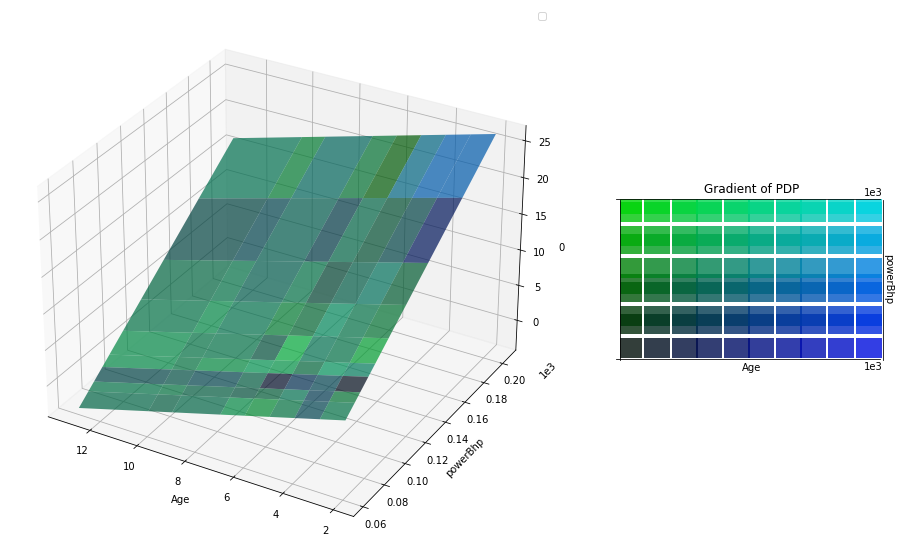

In [205]:
interpreter.load_data(xtrain, feature_names=xtrain.columns)

print("2-way partial dependence plots")
# Features can passed as a tuple for 2-way partial plot
pdp_features = [('Age', 'powerBhp')]
interpreter.partial_dependence.plot_partial_dependence(
    pdp_features, model, grid_resolution=10
)

1-way partial dependence plots
[22/22] grid cells ████████████████████ Time elapsed: 0 seconds

[[<Figure size 1152x720 with 1 Axes>,
  <AxesSubplot:xlabel='powerBhp', ylabel='0'>],
 [<Figure size 1152x720 with 1 Axes>, <AxesSubplot:xlabel='Age', ylabel='0'>]]

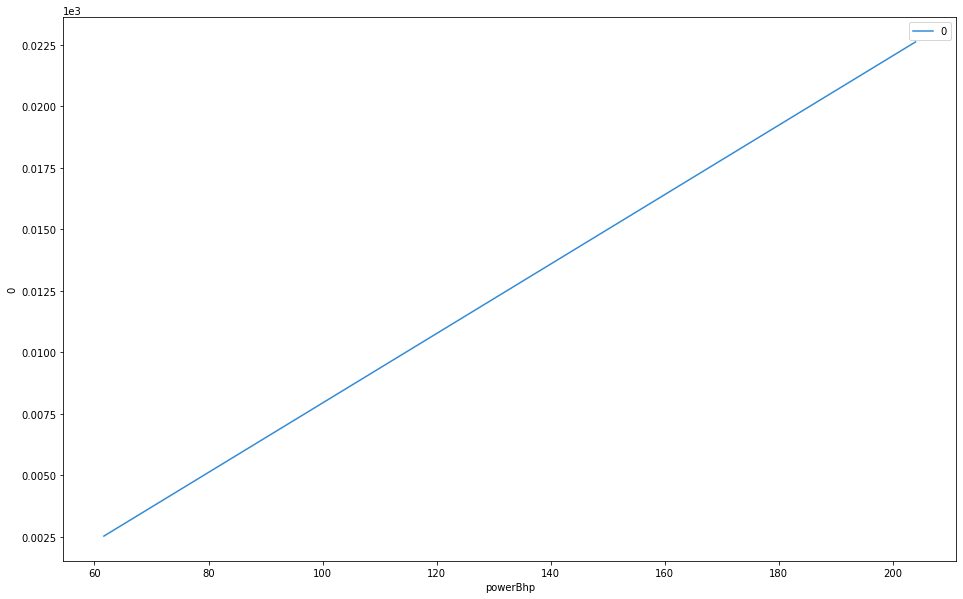

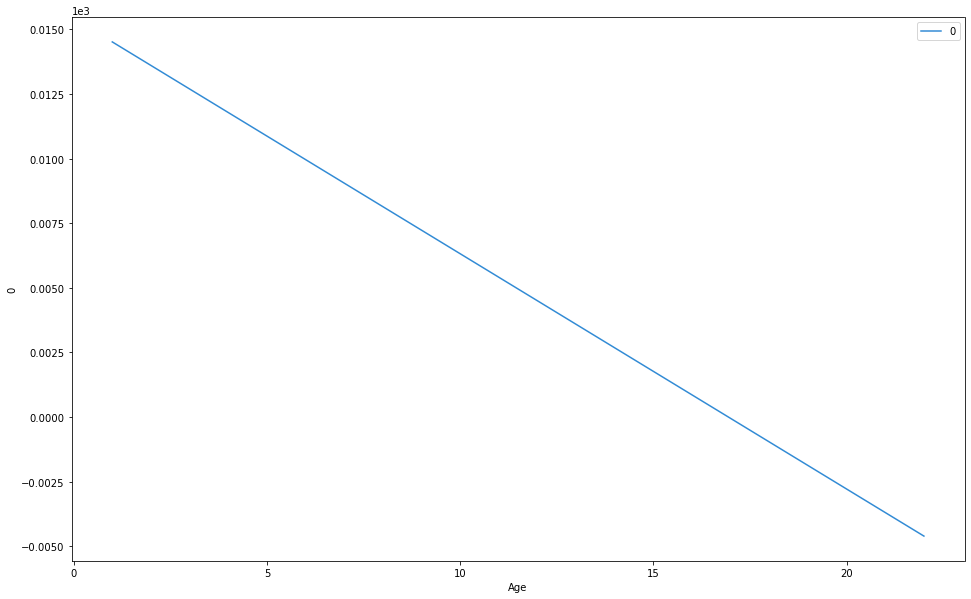

In [206]:
print("1-way partial dependence plots")
# or as independent features for 1-way partial plots
pdp_features = ['powerBhp', 'Age']
interpreter.partial_dependence.plot_partial_dependence(
    pdp_features, model, grid_resolution=30
)

[22/22] grid cells ████████████████████ Time elapsed: 0 seconds

[[<Figure size 1152x720 with 1 Axes>,
  <AxesSubplot:xlabel='powerBhp', ylabel='0'>],
 [<Figure size 1152x720 with 1 Axes>, <AxesSubplot:xlabel='Age', ylabel='0'>]]

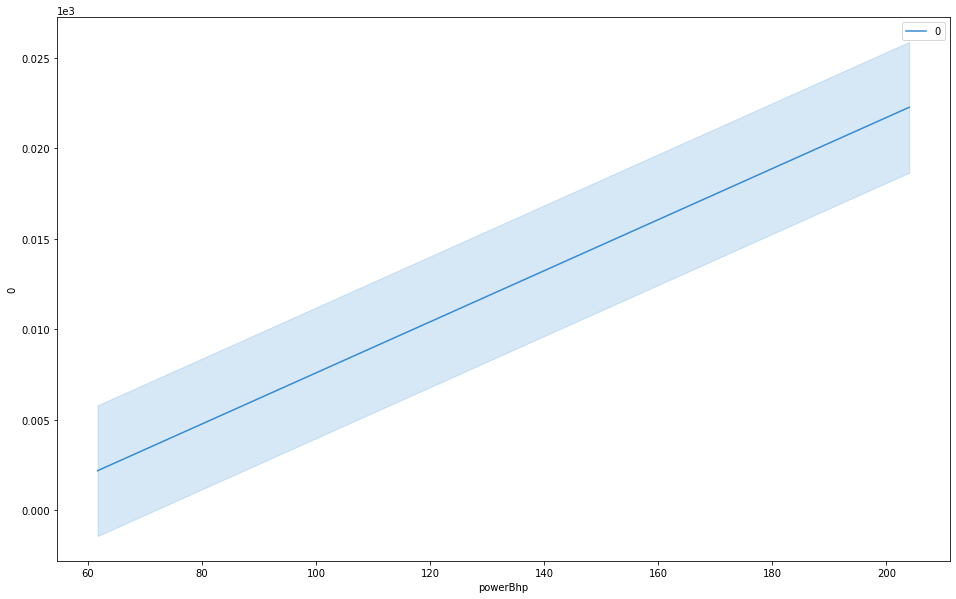

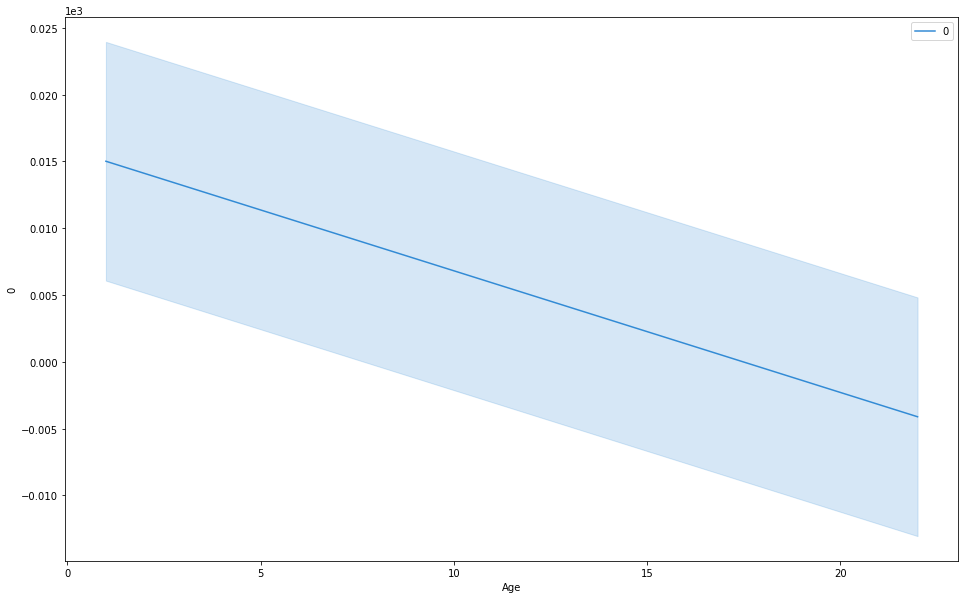

In [207]:
# Partial Plot with variance effect
interpreter.partial_dependence.plot_partial_dependence(
    pdp_features, model, grid_resolution=30, with_variance=True
)


In [208]:
##############


In [209]:
import eli5

The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
The sklearn.feature_selection.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_selection. Anything that cannot be imported from sklearn.feature_selection is now part of the private API.
Using TensorFlow backend.


In [210]:
eli5.show_weights(new_model,
                 feature_names=list(xtrain.columns))

Weight?,Feature
+8.972,FuelType_Electric
+2.348,Location_Coimbatore
+1.963,Location_Bangalore
+1.915,Location_Hyderabad
+1.654,OwnerType_Third
+1.551,<BIAS>
+1.073,Location_Chennai
+0.663,Location_Jaipur
+0.141,powerBhp
-0.540,OwnerType_Second


In [211]:
eli5.explain_weights(new_model, feature_names=list(xtrain.columns))

Weight?,Feature
+8.972,FuelType_Electric
+2.348,Location_Coimbatore
+1.963,Location_Bangalore
+1.915,Location_Hyderabad
+1.654,OwnerType_Third
+1.551,<BIAS>
+1.073,Location_Chennai
+0.663,Location_Jaipur
+0.141,powerBhp
-0.540,OwnerType_Second


In [212]:
eli5.explain_prediction(new_model,xtrain.iloc[60])

Explanation(estimator='LinearRegression()', description=None, error=None, method='linear model', is_regression=True, targets=[TargetExplanation(target='y', feature_weights=FeatureWeights(pos=[FeatureWeight(feature='powerBhp', weight=10.439242250065277, std=None, value=74.0), FeatureWeight(feature='<BIAS>', weight=1.5511454393632125, std=None, value=1.0)], neg=[FeatureWeight(feature='Age', weight=-4.553913149805583, std=None, value=5.0), FeatureWeight(feature='Transmission_Manual', weight=-2.6708132476876636, std=None, value=1.0)], pos_remaining=0, neg_remaining=0), proba=None, score=4.765661291935244, weighted_spans=None, heatmap=None)], feature_importances=None, decision_tree=None, highlight_spaces=None, transition_features=None, image=None)

In [213]:
from eli5.sklearn import PermutationImportance

In [214]:
perm = PermutationImportance(new_model)
perm.fit(xtest, ytest)
eli5.show_weights(perm,feature_names=list(xtrain.columns))

Weight,Feature
0.8824 ± 0.0357,powerBhp
0.1470 ± 0.0300,Age
0.0251 ± 0.0065,Transmission_Manual
0.0080 ± 0.0023,FuelType_Petrol
0.0057 ± 0.0050,Location_Hyderabad
0.0055 ± 0.0032,Location_Coimbatore
0.0044 ± 0.0030,Location_Bangalore
0.0021 ± 0.0017,Location_Mumbai
0.0012 ± 0.0003,Location_Jaipur
0.0004 ± 0.0007,Location_Kolkata
